In [1]:
!nvidia-smi

import torch
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

Mon Dec  8 20:01:44 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   77C    P0             36W /   70W |     878MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
!git clone https://github.com/fawnliu/VGSD.git
%cd VGSD

!pip install timm einops -q

fatal: destination path 'VGSD' already exists and is not an empty directory.
/content/VGSD


In [3]:
import gdown
import os

os.makedirs('checkpoints', exist_ok=True)




In [4]:
from google.colab import files
import shutil

os.makedirs('demo_input', exist_ok=True)
os.makedirs('demo_output', exist_ok=True)

print("Upload your glass images or video frames:")
print("(Supported: .jpg, .png, .mp4)")
uploaded = files.upload()

for filename in uploaded.keys():
    if filename.endswith('.mp4'):
        # Extract frames from video
        !ffmpeg -i "{filename}" -vf fps=5 demo_input/frame_%04d.png -y -loglevel quiet
        print(f"Extracted frames from {filename}")
    else:
        shutil.move(filename, f'demo_input/{filename}')
        print(f"Moved {filename} to demo_input/")

!ls demo_input/

Upload your glass images or video frames:
(Supported: .jpg, .png, .mp4)


Saving glass_video2.mp4 to glass_video2.mp4
Extracted frames from glass_video2.mp4
frame_0001.png	frame_0008.png	frame_0015.png	frame_0022.png	frame_0029.png
frame_0002.png	frame_0009.png	frame_0016.png	frame_0023.png	frame_0030.png
frame_0003.png	frame_0010.png	frame_0017.png	frame_0024.png	frame_0031.png
frame_0004.png	frame_0011.png	frame_0018.png	frame_0025.png	frame_0032.png
frame_0005.png	frame_0012.png	frame_0019.png	frame_0026.png	frame_0033.png
frame_0006.png	frame_0013.png	frame_0020.png	frame_0027.png	frame_0034.png
frame_0007.png	frame_0014.png	frame_0021.png	frame_0028.png	frame_0035.png


In [5]:
import torch
import torch.nn.functional as F
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
import glob
from tqdm import tqdm

# Add repo to path
import sys
sys.path.insert(0, '/content/VGSD')

# Load model architecture
from networks.VGD_reflection import VGD_Network

def load_model(checkpoint_path):
    """Load pretrained VGSD model"""
    model = VGD_Network()

    checkpoint = torch.load(checkpoint_path, map_location='cuda')
    model.load_state_dict(checkpoint['model'] if 'model' in checkpoint else checkpoint)
    model.cuda()
    model.eval()
    return model

def preprocess_image(img_path, size=(384, 384)):
    """Preprocess single image for inference"""
    img = Image.open(img_path).convert('RGB')
    original_size = img.size

    transform = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                           std=[0.229, 0.224, 0.225])
    ])

    tensor = transform(img).unsqueeze(0).cuda()
    return tensor, img, original_size

def run_inference(model, img_tensor):
    """Run model inference"""
    with torch.no_grad():
        output = model(img_tensor)
        # Handle different output formats
        if isinstance(output, (list, tuple)):
            pred = output[0]
        else:
            pred = output

        pred = torch.sigmoid(pred)
        pred = F.interpolate(pred, size=(384, 384), mode='bilinear', align_corners=False)

    return pred.squeeze().cpu().numpy()

def visualize_result(original_img, mask, save_path=None):
    """Visualize glass detection result"""
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Original
    axes[0].imshow(original_img)
    axes[0].set_title('Original')
    axes[0].axis('off')

    # Resize mask to match original image (not the other way around)
    mask_resized = np.array(Image.fromarray((mask * 255).astype(np.uint8)).resize(original_img.size)) / 255.0

    # Mask
    axes[1].imshow(mask_resized, cmap='hot')
    axes[1].set_title('Glass Detection Mask')
    axes[1].axis('off')

    # Overlay - resize mask to original, not image to mask
    img_array = np.array(original_img).astype(np.float32)
    mask_rgb = plt.cm.Reds(mask_resized)[:, :, :3] * 255
    alpha = 0.5
    mask_weight = mask_resized[:, :, np.newaxis]
    overlay = (1 - mask_weight * alpha) * img_array + (mask_weight * alpha) * mask_rgb
    overlay = np.clip(overlay, 0, 255).astype(np.uint8)

    axes[2].imshow(overlay)
    axes[2].set_title('Overlay')
    axes[2].axis('off')

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()

In [6]:
# Download both model files
!wget -O checkpoints/VGSD.pth https://github.com/fawnliu/VGSD/releases/download/1.0/VGSD.pth
!wget -O checkpoints/resnext_101_32x4d.pth https://github.com/fawnliu/VGSD/releases/download/1.0/resnext_101_32x4d.pth

# Fix the hardcoded path in their code
!sed -i "s|checkpoints/resnext_101_32x4d.pth|/content/VGSD/checkpoints/resnext_101_32x4d.pth|g" networks/resnext_modify/resnext101_regular.py

!ls -lh checkpoints/

--2025-12-08 20:04:44--  https://github.com/fawnliu/VGSD/releases/download/1.0/VGSD.pth
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/730122254/6371ad45-9095-4046-bcee-d8832d8d8b0f?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-12-08T20%3A50%3A35Z&rscd=attachment%3B+filename%3DVGSD.pth&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2025-12-08T19%3A49%3A55Z&ske=2025-12-08T20%3A50%3A35Z&sks=b&skv=2018-11-09&sig=GOSjzxYSdKUcZ2foX%2FvgdXs2gSVs%2FYPsBn0HyVYzwrw%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNvbnRlbnQuY29tIiwia2V5Ijoia2V5MSIsImV4cCI6MTc2NTIyNzg4NSwibmJmIjoxNzY1MjI0Mjg1LCJwYXRoIjoicmVsZWFzZWFzc2V0cHJvZHVjdGlvbi5ibG9iLmNvcmUud2luZG

In [7]:
# Overwrite the config file with the correct absolute path
with open('networks/resnext_modify/config.py', 'w') as f:
    f.write("resnext_101_32_path = '/content/VGSD/checkpoints/resnext_101_32x4d.pth'\n")


# Verify it worked
!cat networks/resnext_modify/config.py

resnext_101_32_path = '/content/VGSD/checkpoints/resnext_101_32x4d.pth'


In [8]:
def run_inference(model, img_tensor):
    """Run model inference"""
    with torch.no_grad():
        # Model expects 3 inputs (likely: current frame, previous frame, reflection map)
        # For demo, we'll pass the same image for all three
        output = model(img_tensor, img_tensor, img_tensor)

        # Handle different output formats
        if isinstance(output, (list, tuple)):
            pred = output[0]
        else:
            pred = output

        pred = torch.sigmoid(pred)

    return pred.squeeze().cpu().numpy()

In [9]:
# Load model
model = load_model('checkpoints/VGSD.pth')
print("Model loaded!")

Load pretrained ResNeXt101 !!!!!! /content/VGSD/checkpoints/resnext_101_32x4d.pth
<All keys matched successfully>


/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


Model loaded!


In [10]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Found 35 images


  0%|          | 0/35 [00:00<?, ?it/s]/content/VGSD/networks/VGD_reflection.py:84: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  exemplar_pre = F.upsample(exemplar_pre, input_size, mode='bilinear', align_corners=False)
/content/VGSD/networks/VGD_reflection.py:85: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  query_pre = F.upsample(query_pre, input_size, mode='bilinear', align_corners=False)
/content/VGSD/networks/VGD_reflection.py:86: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  other_pre = F.upsample(other_pre, input_size, mode='bilinear', align_corners=False)


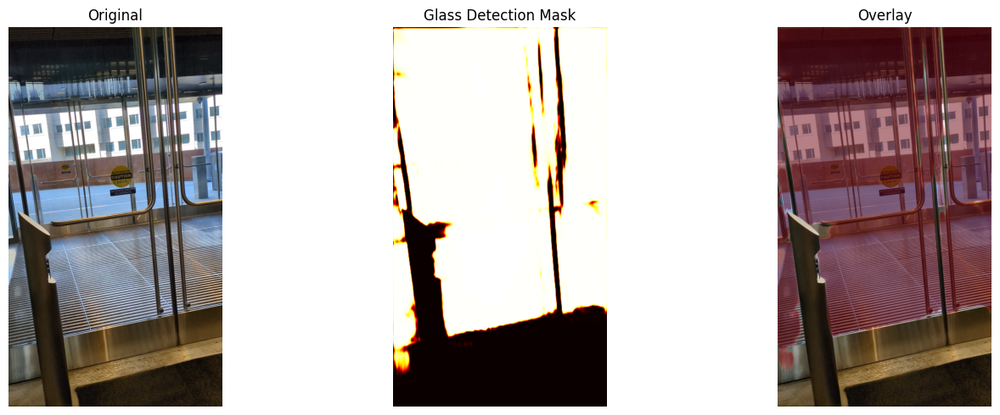

  3%|▎         | 1/35 [00:09<05:06,  9.00s/it]

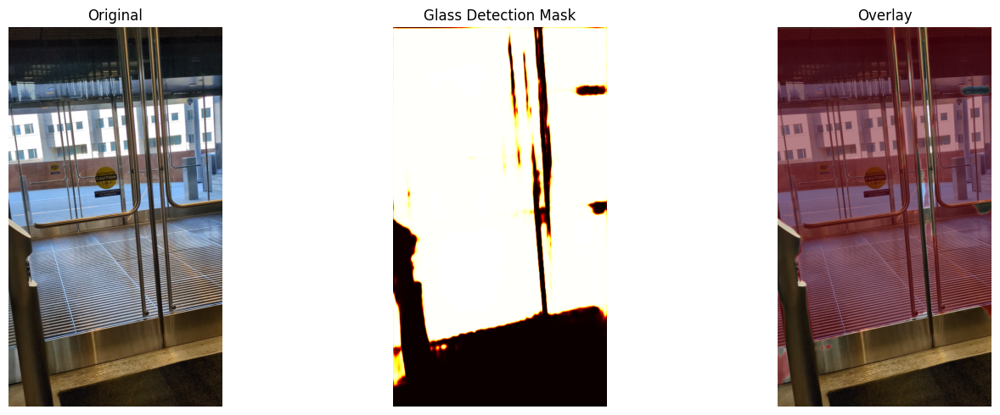

  6%|▌         | 2/35 [00:16<04:23,  7.98s/it]

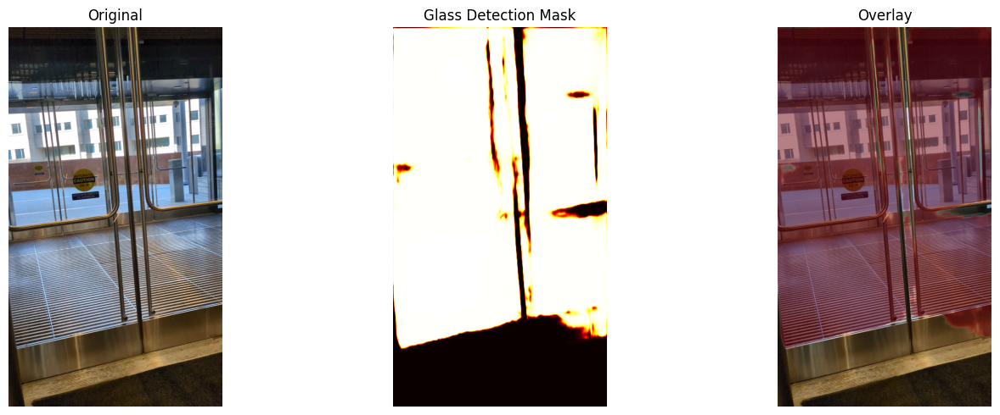

  9%|▊         | 3/35 [00:24<04:19,  8.11s/it]

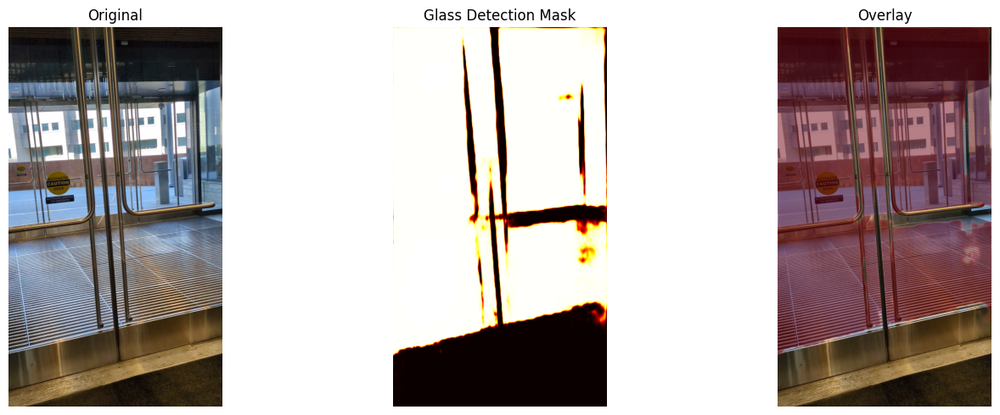

 11%|█▏        | 4/35 [00:31<03:59,  7.73s/it]

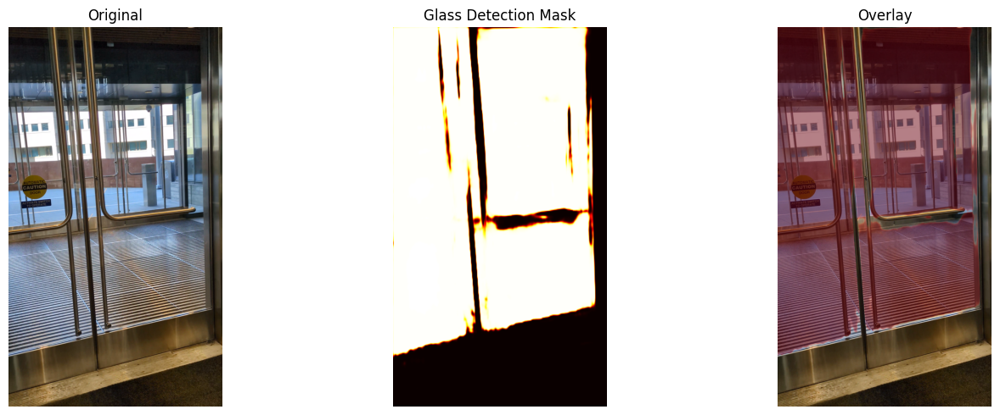

 14%|█▍        | 5/35 [00:39<03:56,  7.89s/it]

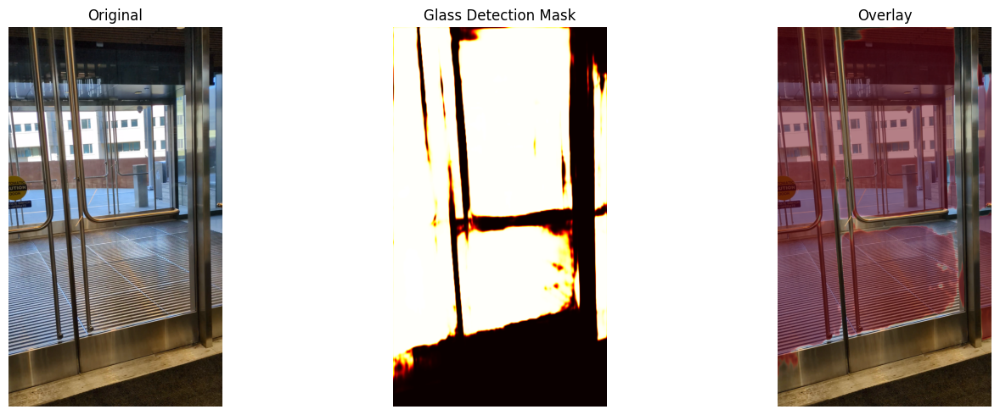

 17%|█▋        | 6/35 [00:47<03:44,  7.75s/it]

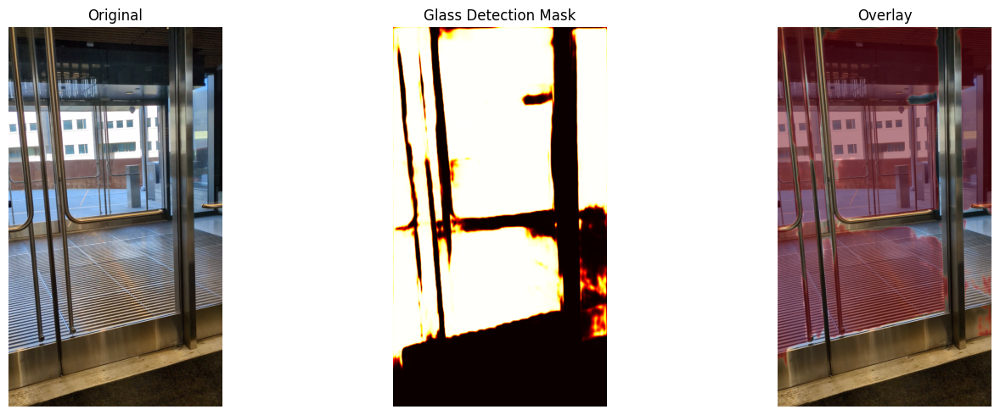

 20%|██        | 7/35 [00:54<03:35,  7.70s/it]

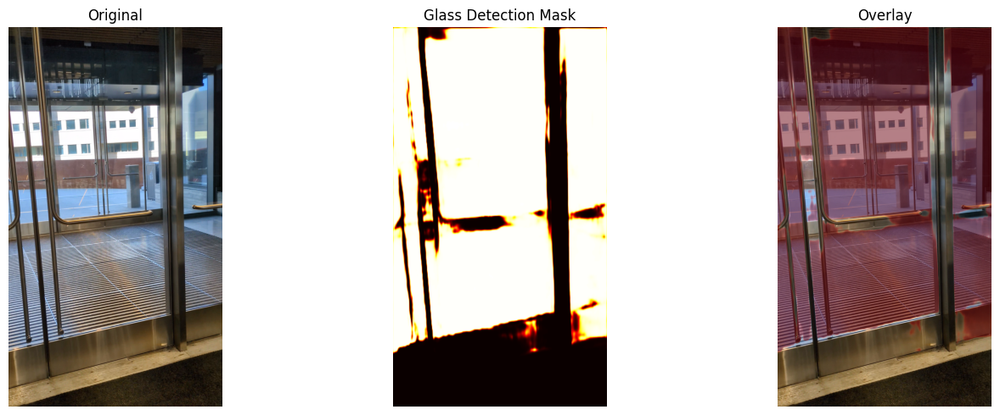

 23%|██▎       | 8/35 [01:03<03:33,  7.89s/it]

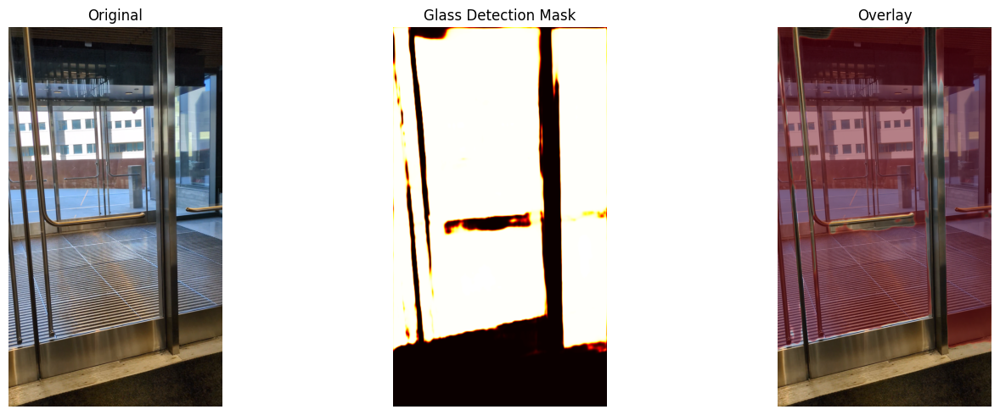

 26%|██▌       | 9/35 [01:10<03:18,  7.65s/it]

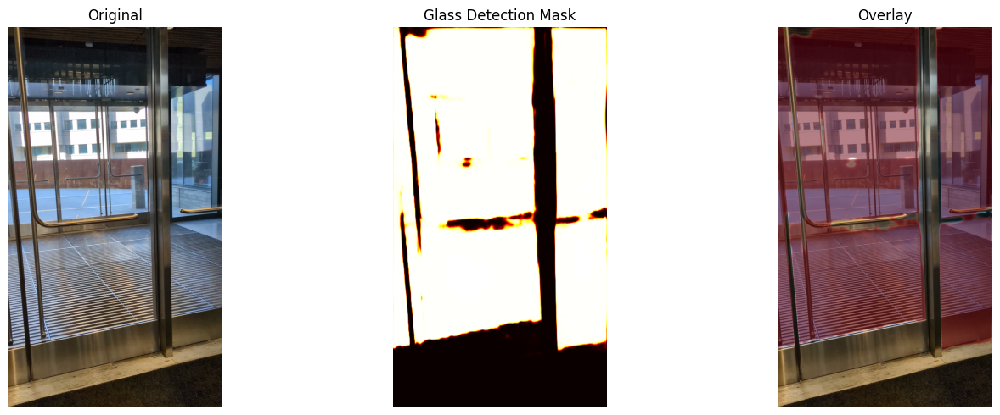

 29%|██▊       | 10/35 [01:18<03:15,  7.82s/it]

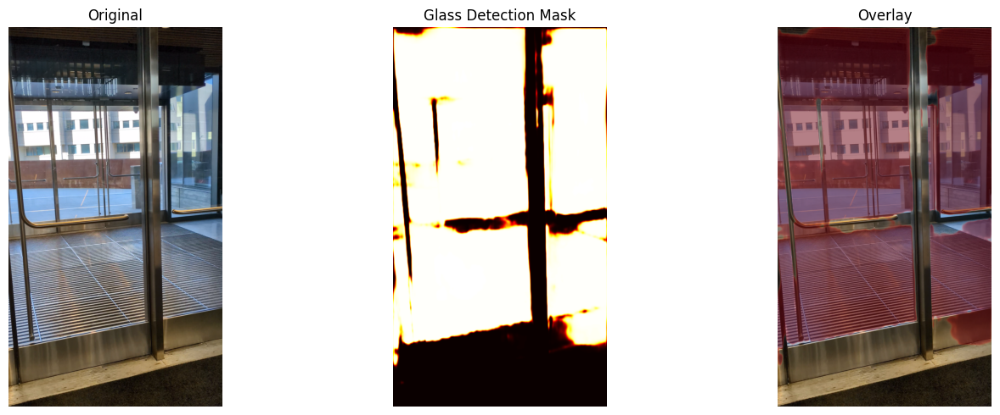

 31%|███▏      | 11/35 [01:25<03:02,  7.60s/it]

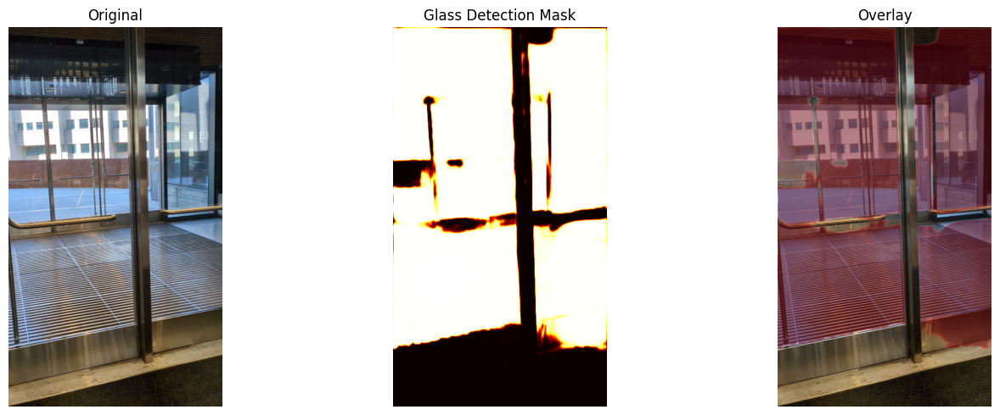

 34%|███▍      | 12/35 [01:34<03:05,  8.07s/it]

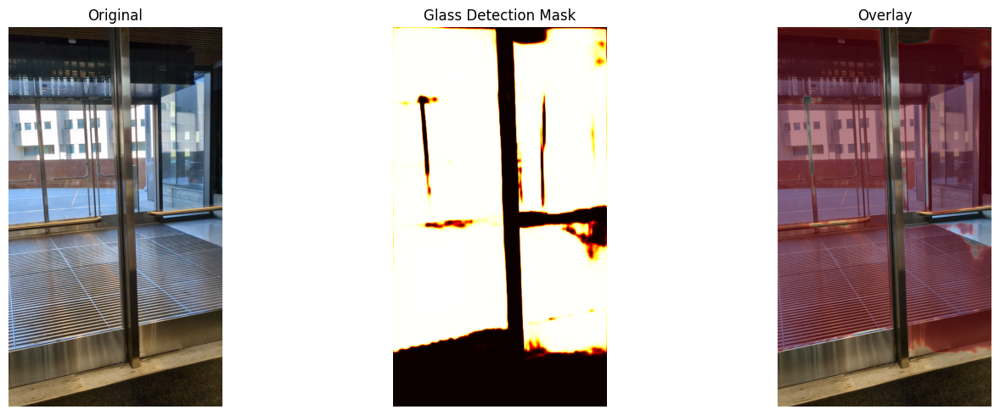

 37%|███▋      | 13/35 [01:43<02:58,  8.12s/it]

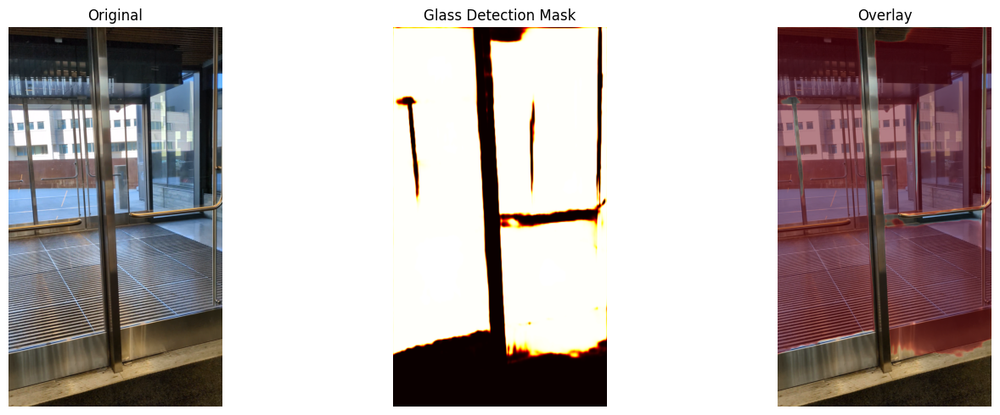

 40%|████      | 14/35 [01:49<02:42,  7.74s/it]

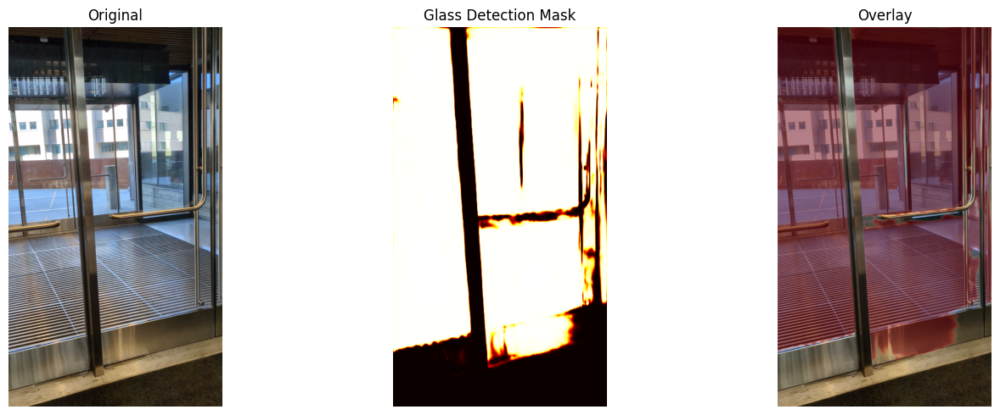

 43%|████▎     | 15/35 [01:57<02:36,  7.85s/it]

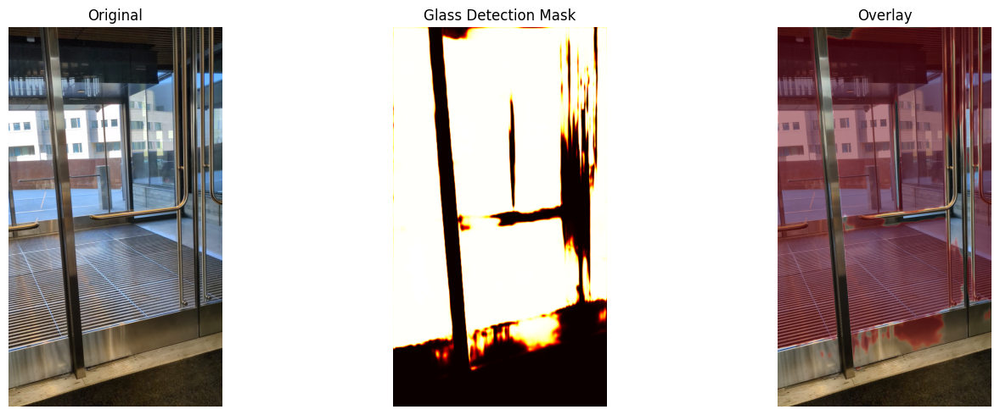

 46%|████▌     | 16/35 [02:04<02:24,  7.58s/it]

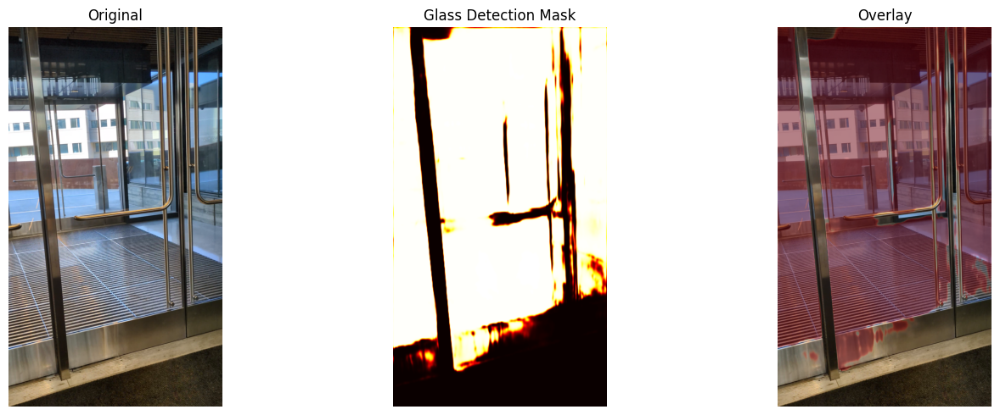

 49%|████▊     | 17/35 [02:12<02:18,  7.69s/it]

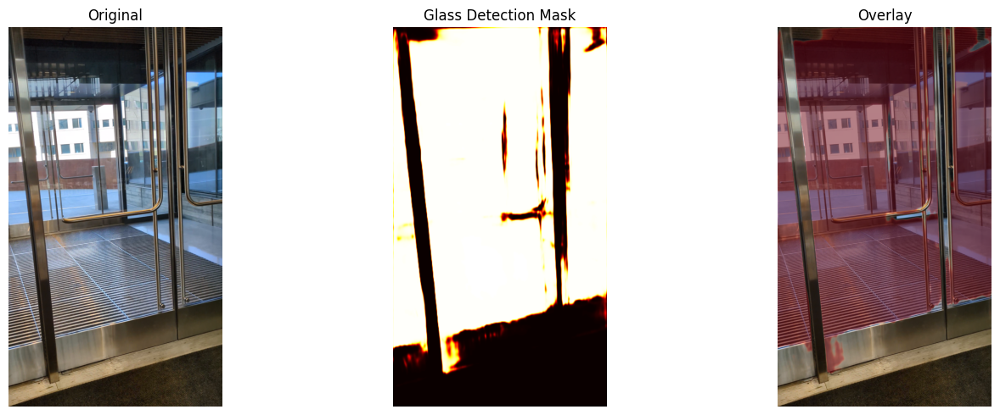

 51%|█████▏    | 18/35 [02:20<02:10,  7.67s/it]

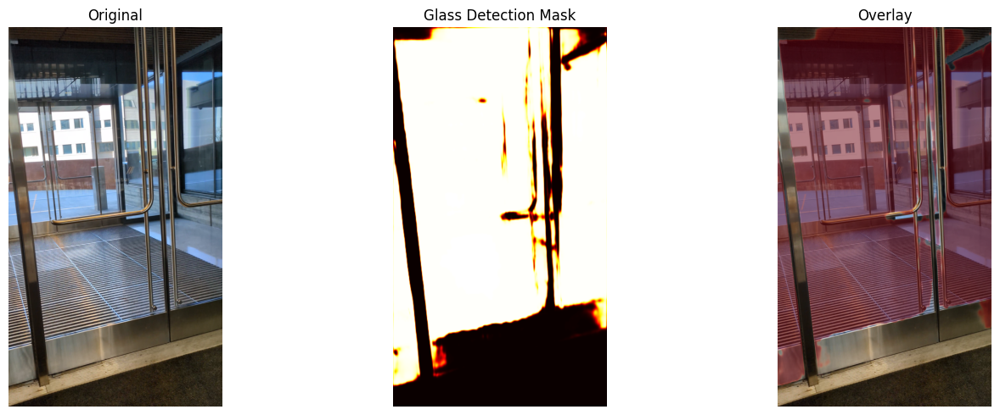

 54%|█████▍    | 19/35 [02:28<02:02,  7.63s/it]

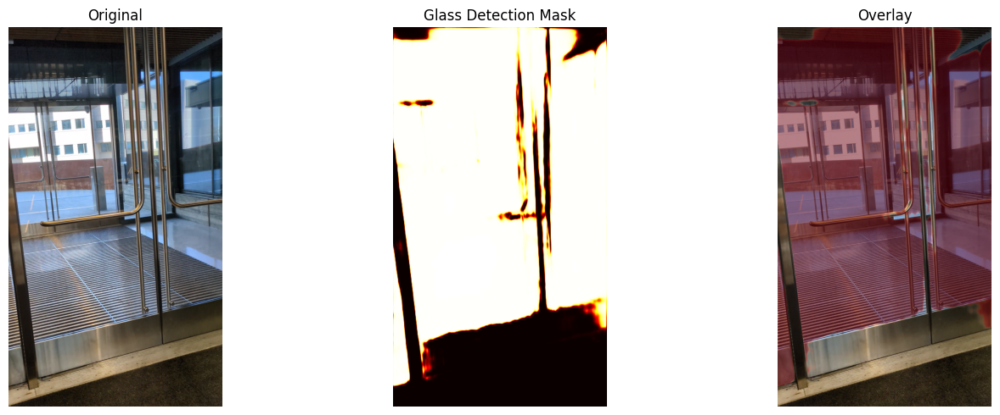

 57%|█████▋    | 20/35 [02:36<01:57,  7.83s/it]

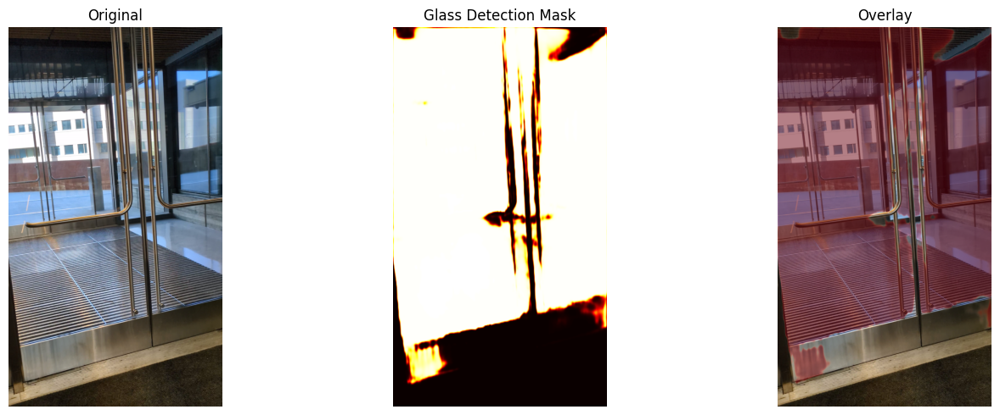

 60%|██████    | 21/35 [02:43<01:46,  7.63s/it]

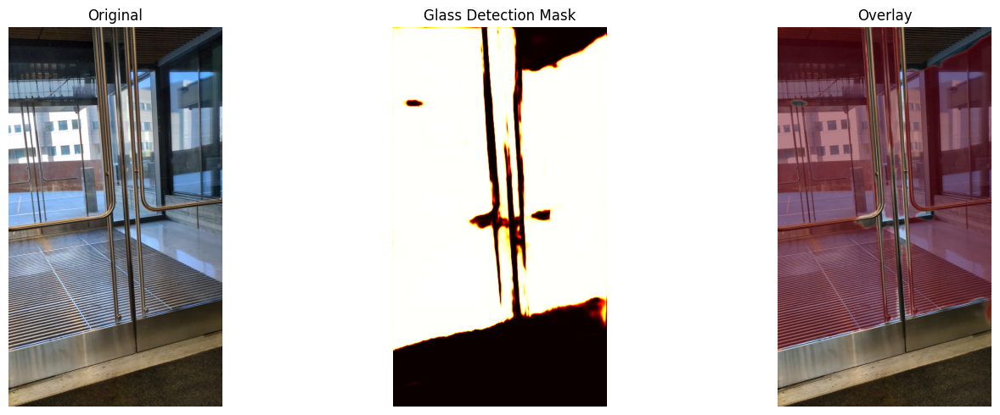

 63%|██████▎   | 22/35 [02:51<01:42,  7.85s/it]

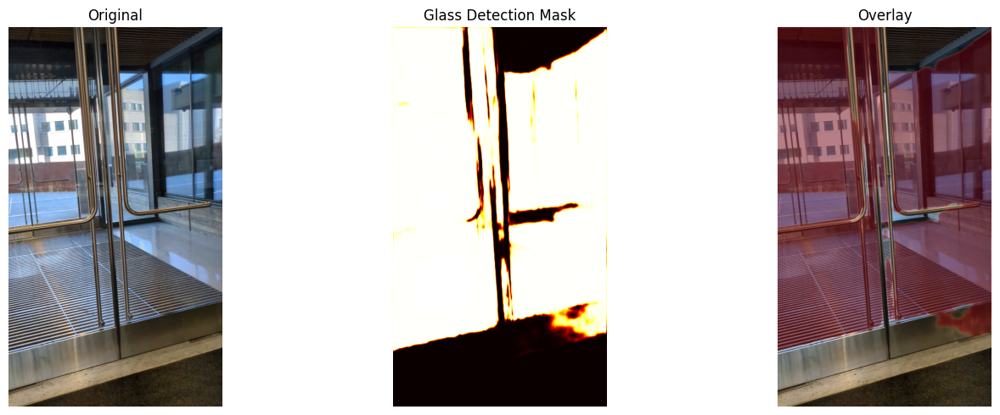

 66%|██████▌   | 23/35 [02:58<01:31,  7.63s/it]

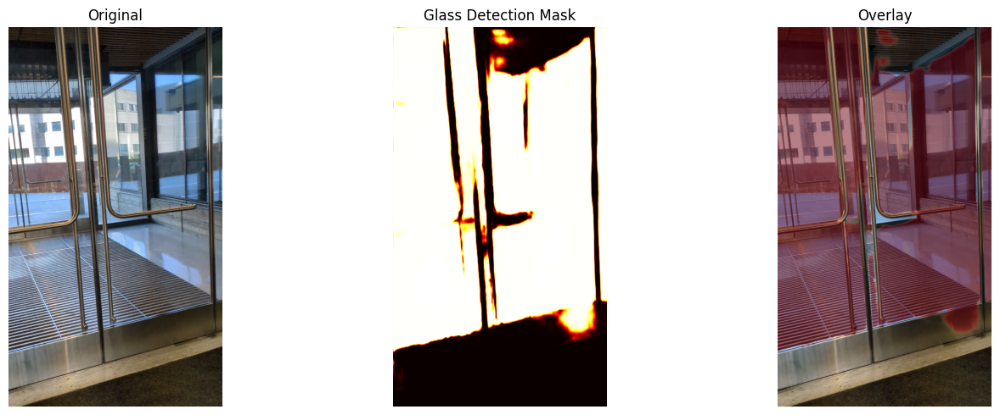

 69%|██████▊   | 24/35 [03:07<01:25,  7.75s/it]

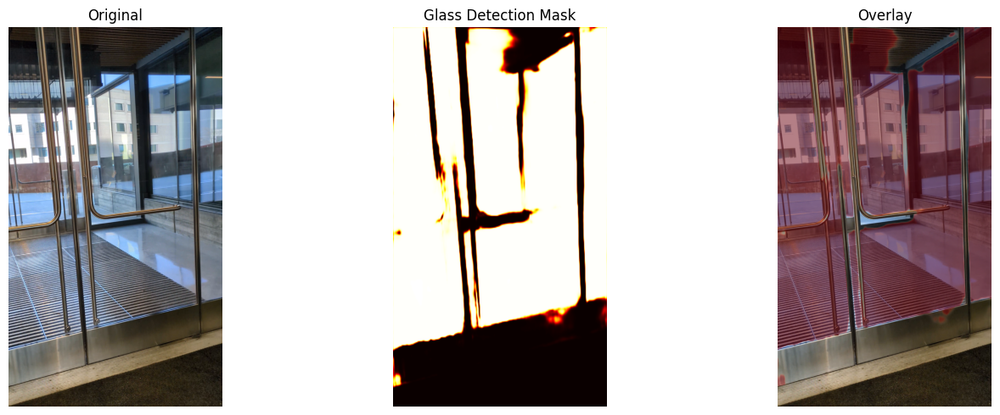

 71%|███████▏  | 25/35 [03:15<01:18,  7.83s/it]

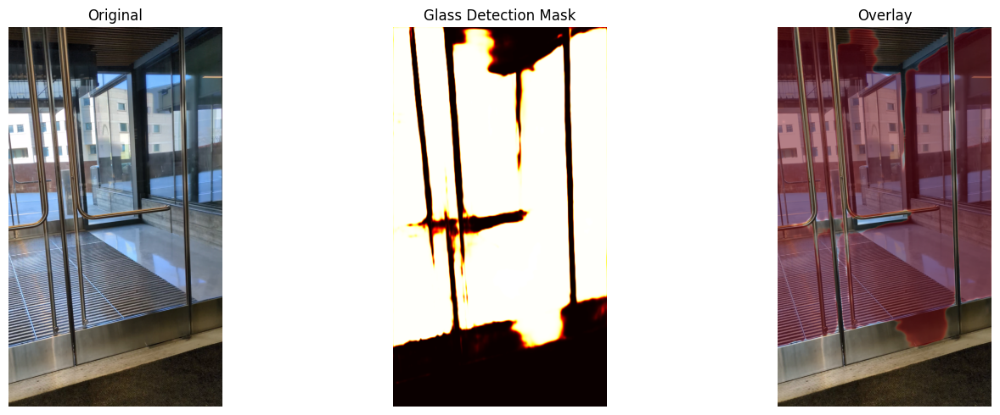

 74%|███████▍  | 26/35 [03:22<01:09,  7.67s/it]

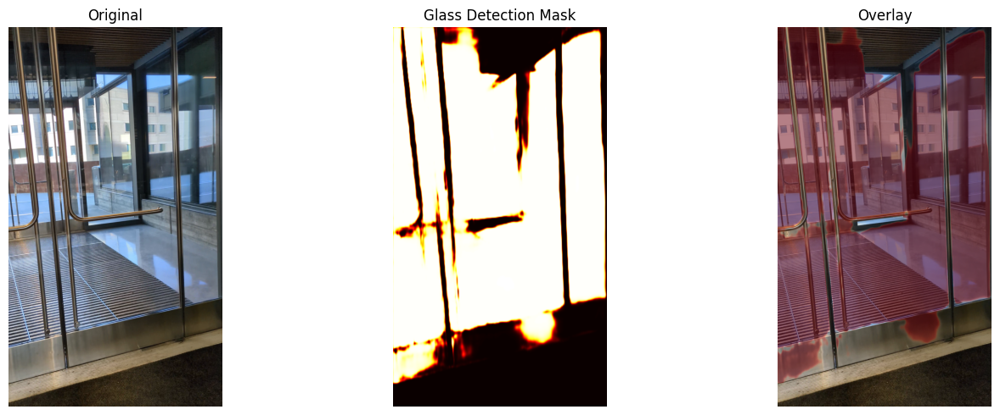

 77%|███████▋  | 27/35 [03:30<01:02,  7.84s/it]

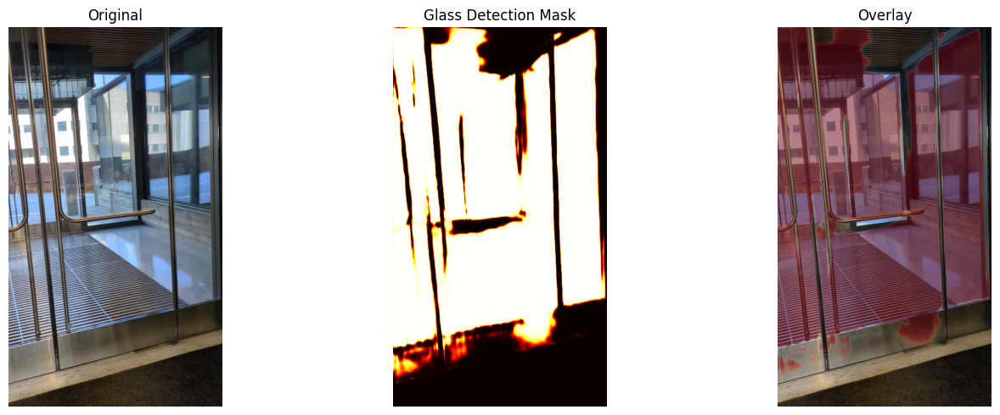

 80%|████████  | 28/35 [03:37<00:53,  7.61s/it]

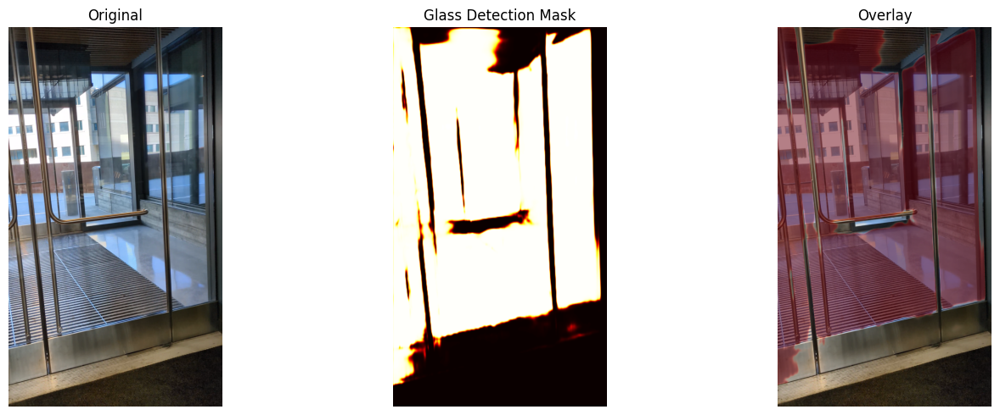

 83%|████████▎ | 29/35 [03:45<00:46,  7.75s/it]

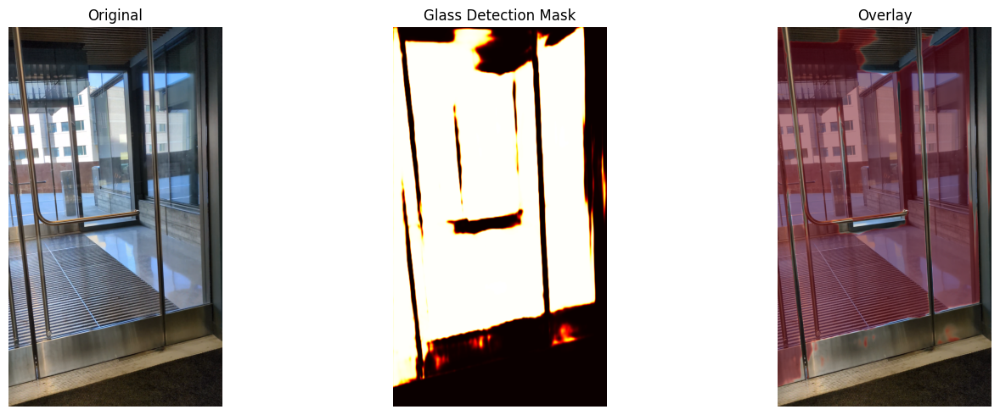

 86%|████████▌ | 30/35 [03:52<00:37,  7.59s/it]

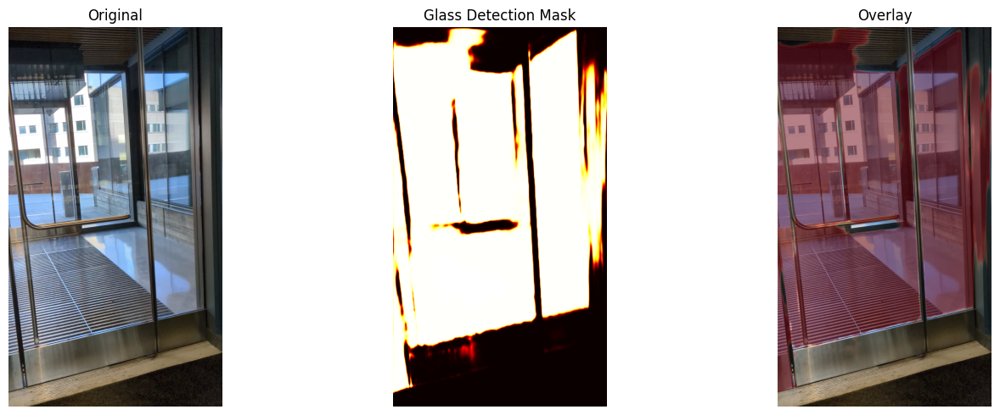

 89%|████████▊ | 31/35 [04:00<00:30,  7.63s/it]

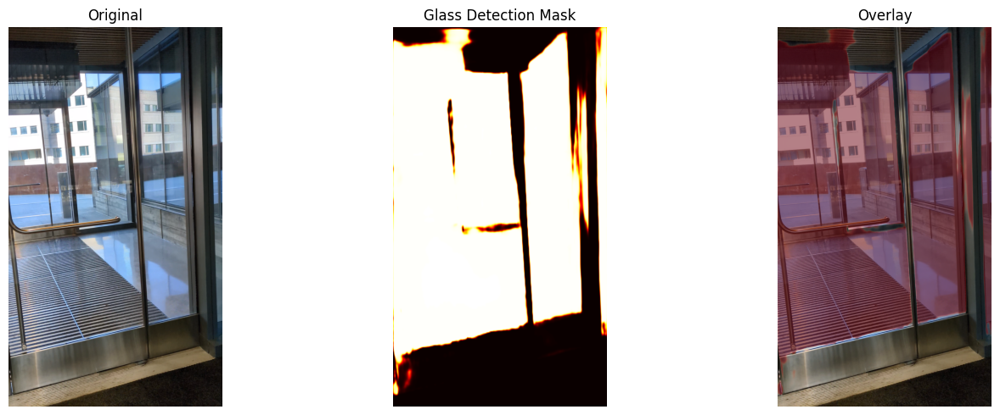

 91%|█████████▏| 32/35 [04:08<00:23,  7.73s/it]

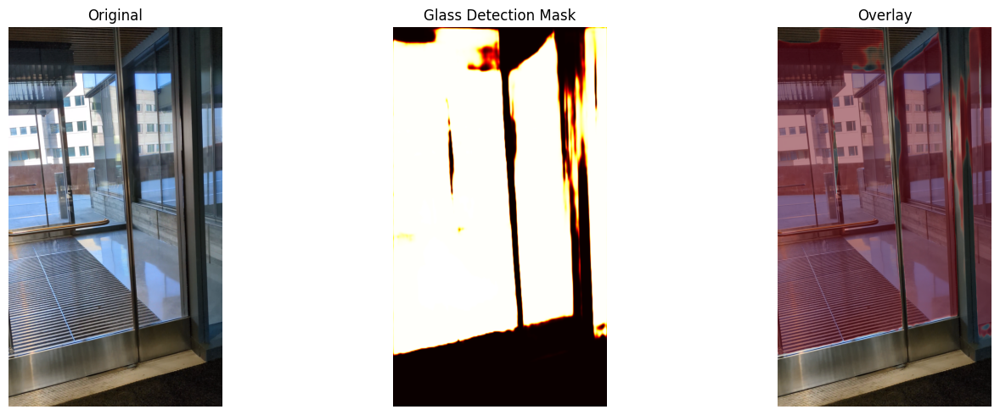

 94%|█████████▍| 33/35 [04:15<00:15,  7.56s/it]

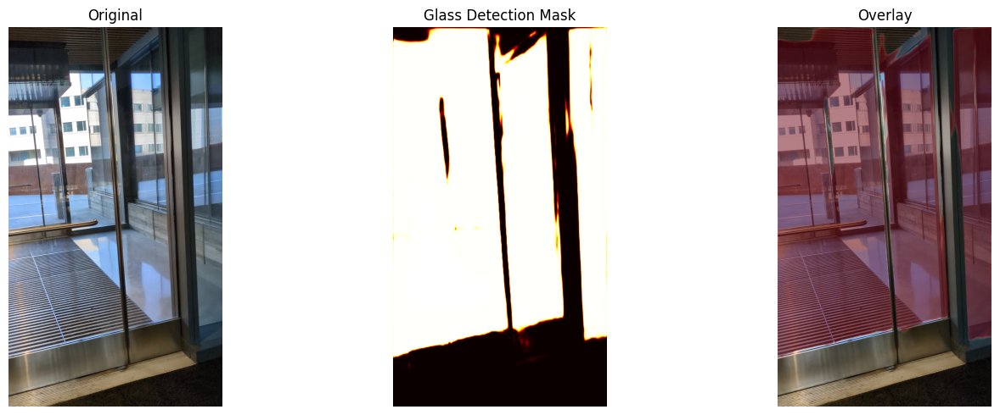

 97%|█████████▋| 34/35 [04:23<00:07,  7.75s/it]

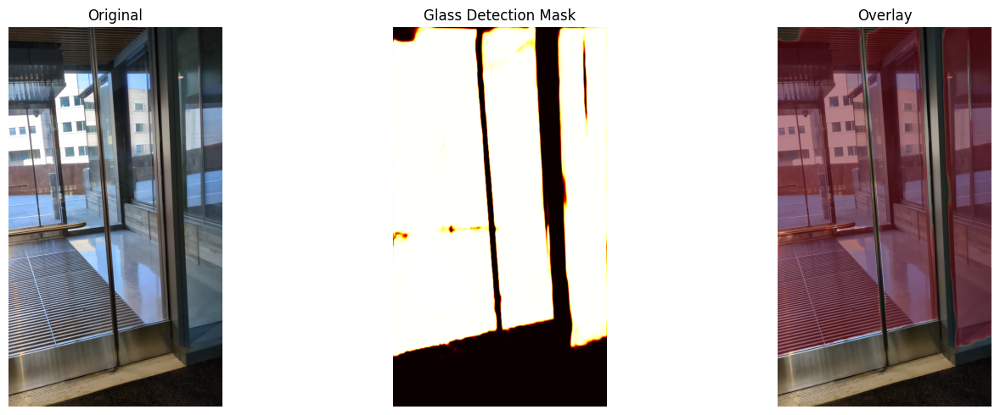

100%|██████████| 35/35 [04:31<00:00,  7.74s/it]


Results saved to demo_output/


In [11]:

# Get all input images
image_paths = sorted(glob.glob('demo_input/*.png') + glob.glob('demo_input/*.jpg'))
print(f"Found {len(image_paths)} images")

# Run inference on each
for i, img_path in enumerate(tqdm(image_paths)):
    img_tensor, original_img, orig_size = preprocess_image(img_path)
    mask = run_inference(model, img_tensor)

    # Save and visualize
    save_path = f'demo_output/result_{i:04d}.png'
    visualize_result(original_img, mask, save_path)

print(f"\nResults saved to demo_output/")

In [12]:
import cv2

output_frames = sorted(glob.glob('demo_output/result_*.png'))
if len(output_frames) > 1:
    frame = cv2.imread(output_frames[0])
    h, w = frame.shape[:2]

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter('demo_output/glass_detection_result.mp4', fourcc, 5, (w, h))

    for frame_path in output_frames:
        frame = cv2.imread(frame_path)
        out.write(frame)

    out.release()
    print("Video saved to demo_output/glass_detection_result.mp4")

    # Download the result
    files.download('demo_output/glass_detection_result.mp4')

Video saved to demo_output/glass_detection_result.mp4


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [13]:
#!zip -r results.zip demo_output/
#files.download('results.zip')